<a href="https://colab.research.google.com/github/saksham-aroraa/Covid-19-detection/blob/main/covid_19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files

In [ ]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"r0x101","key":"70b2de343f4ac35f6c5a4b4e0c014281"}'}

In [ ]:
!mkdir ~/.kaggle 

In [ ]:
!cp kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d bachrr/covid-chest-xray

 98% 237M/241M [00:02<00:00, 131MB/s]
100% 241M/241M [00:02<00:00, 116MB/s]


In [ ]:
!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia

 99% 2.28G/2.29G [00:31<00:00, 70.9MB/s]
100% 2.29G/2.29G [00:31<00:00, 77.7MB/s]


In [ ]:
!cd /content
!ls

chest-xray-pneumonia.zip  covid-chest-xray.zip	kaggle.json  sample_data


In [ ]:
!mkdir -p input/covid-chest-xray
!mkdir -p input/chest-xray-pneumonia

In [ ]:
!rm -rf dataset
!mkdir -p dataset/covid
!mkdir -p dataset/normal

In [ ]:
!unzip covid-chest-xray.zip -d input/covid-chest-xray

Archive:  covid-chest-xray.zip
  inflating: input/covid-chest-xray/annotations/imageannotation_ai_lung_bounding_boxes.json  
  inflating: input/covid-chest-xray/images/01E392EE-69F9-4E33-BFCE-E5C968654078.jpeg  
  inflating: input/covid-chest-xray/images/03BF7561-A9BA-4C3C-B8A0-D3E585F73F3C.jpeg  
  inflating: input/covid-chest-xray/images/1-s2.0-S0140673620303706-fx1_lrg.jpg  
  inflating: input/covid-chest-xray/images/1-s2.0-S0929664620300449-gr2_lrg-a.jpg  
  inflating: input/covid-chest-xray/images/1-s2.0-S0929664620300449-gr2_lrg-b.jpg  
  inflating: input/covid-chest-xray/images/1-s2.0-S0929664620300449-gr2_lrg-c.jpg  
  inflating: input/covid-chest-xray/images/1-s2.0-S0929664620300449-gr2_lrg-d.jpg  
  inflating: input/covid-chest-xray/images/1-s2.0-S0929664620300449-gr3_lrg-a.jpg  
  inflating: input/covid-chest-xray/images/1-s2.0-S0929664620300449-gr3_lrg-b.jpg  
  inflating: input/covid-chest-xray/images/1-s2.0-S0929664620300449-gr3_lrg-c.jpg  
  inflating: input/covid-chest-

In [ ]:
!unzip chest-xray-pneumonia.zip -d input/chest-xray-pneumonia

Streaming output truncated to the last 5000 lines.
  inflating: input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0435-0001-0001.jpeg  
  inflating: input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0435-0001.jpeg  
  inflating: input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0437-0001-0001.jpeg  
  inflating: input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0437-0001-0002.jpeg  
  inflating: input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0437-0001.jpeg  
  inflating: input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0438-0001.jpeg  
  inflating: input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0439-0001-0001.jpeg  
  inflating: input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0439-0001-0002.jpeg  
  inflating: input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0439-0001.jpeg  
  inflating: input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0440-0001.jpeg  
  inflating: input/chest-xray-pneumonia/chest_xray/train/NORMAL/IM-0441-0001.jpeg  


In [ ]:
!pip install imutils

In [ ]:
from keras import backend as K
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from imutils import paths
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import random
import shutil
import cv2
import os

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
dataset_path='./dataset'

In [ ]:
"""Covid X-ray"""
samples = 141
covid_dataset_path = '../content/input/covid-chest-xray'
csvPath = os.path.sep.join([covid_dataset_path, "metadata.csv"])
df = pd.read_csv(csvPath)
for (i, row) in df.iterrows():
  if row["finding"] != "COVID-19" or row["view"] != "PA":
    continue
  imagePath = os.path.sep.join([covid_dataset_path, "images", row["filename"]])
  if not os.path.exists(imagePath):
    continue
  filename = row["filename"].split(os.path.sep)[-1]
  outputPath = os.path.sep.join([f"{dataset_path}/covid", filename])
  shutil.copy2(imagePath, outputPath)

In [ ]:
"""Normal X-ray dataset"""
pneumonia_dataset_path ='../content/input/chest-xray-pneumonia/chest_xray'
basePath = os.path.sep.join([pneumonia_dataset_path, "train", "NORMAL"])
imagePaths = list(paths.list_images(basePath))
print(len(imagePaths))
random.seed(42)
random.shuffle(imagePaths)
imagePaths = imagePaths[:samples]
for (i, imagePath) in enumerate(imagePaths):
  filename = imagePath.split(os.path.sep)[-1]
  outputPath = os.path.sep.join([f"{dataset_path}/normal", filename])
  shutil.copy2(imagePath, outputPath)

1341


In [ ]:
covid_dataset=pd.read_csv("../content/input/covid-chest-xray/metadata.csv")
covid_dataset.head()

,patientid,offset,sex,age,finding,survival,intubated,intubation_present,went_icu,in_icu,needed_supplemental_O2,extubated,temperature,pO2_saturation,leukocyte_count,neutrophil_count,lymphocyte_count,view,modality,date,location,folder,filename,doi,url,license,clinical_notes,other_notes,Unnamed: 28
0,2,0.0,M,65.0,COVID-19,Y,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,NaN,NaN,NaN,PA,X-ray,"January 22, 2020","Cho Ray Hospital, Ho Chi Minh City, Vietnam",images,auntminnie-a-2020_01_28_23_51_6665_2020_01_28_...,10.1056/nejmc2001272,https://www.nejm.org/doi/full/10.1056/NEJMc200...,NaN,"On January 22, 2020, a 65-year-old man with a ...",NaN,NaN
1,2,3.0,M,65.0,COVID-19,Y,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,NaN,NaN,NaN,PA,X-ray,"January 25, 2020","Cho Ray Hospital, Ho Chi Minh City, Vietnam",images,auntminnie-b-2020_01_28_23_51_6665_2020_01_28_...,10.1056/nejmc2001272,https://www.nejm.org/doi/full/10.1056/NEJMc200...,NaN,"On January 22, 2020, a 65-year-old man with a ...",NaN,NaN
2,2,5.0,M,65.0,COVID-19,Y,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,NaN,NaN,NaN,PA,X-ray,"January 27, 2020","Cho Ray Hospital, Ho Chi Minh City, Vietnam",images,auntminnie-c-2020_01_28_23_51_6665_2020_01_28_...,10.1056/nejmc2001272,https://www.nejm.org/doi/full/10.1056/NEJMc200...,NaN,"On January 22, 2020, a 65-year-old man with a ...",NaN,NaN
3,2,6.0,M,65.0,COVID-19,Y,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,NaN,NaN,NaN,PA,X-ray,"January 28, 2020","Cho Ray Hospital, Ho Chi Minh City, Vietnam",images,auntminnie-d-2020_01_28_23_51_6665_2020_01_28_...,10.1056/nejmc2001272,https://www.nejm.org/doi/full/10.1056/NEJMc200...,NaN,"On January 22, 2020, a 65-year-old man with a ...",NaN,NaN
4,4,0.0,F,52.0,COVID-19,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,PA,X-ray,"January 25, 2020","Changhua Christian Hospital, Changhua City, Ta...",images,nejmc2001573_f1a.jpeg,10.1056/NEJMc2001573,https://www.nejm.org/doi/full/10.1056/NEJMc200...,NaN,diffuse infiltrates in the bilateral lower lungs,NaN,NaN


In [ ]:
# function to plot images in a grid
def ceildiv(a, b):
  return -(-a // b)

def plots_from_files(imspaths, figsize=(10,5), rows=1, titles=None, maintitle=None):
  """Plot the images in a grid"""
  f = plt.figure(figsize=figsize)
  if maintitle is not None: plt.suptitle(maintitle, fontsize=10)
  for i in range(len(imspaths)):
    sp = f.add_subplot(rows, ceildiv(len(imspaths), rows), i+1)
    sp.axis('off')
    if titles is not None: sp.set_title(titles[i], fontsize=16)
    img = plt.imread(imspaths[i])
    plt.imshow(img)

In [ ]:
normal_images = list(paths.list_images(f"{dataset_path}/normal"))
covid_images = list(paths.list_images(f"{dataset_path}/covid"))

In [ ]:
print("Normal cases :",len(normal_images))
print("Covid cases :",len(covid_images))

Normal cases : 141
Covid cases : 141


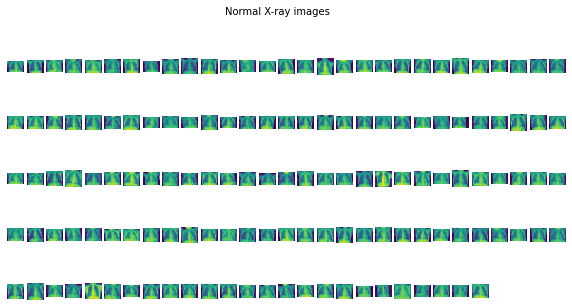

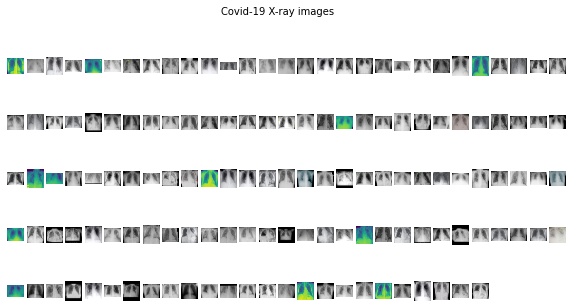

In [ ]:
plots_from_files(normal_images, rows=5, maintitle="Normal X-ray images")
plots_from_files(covid_images, rows=5, maintitle="Covid-19 X-ray images")

In [ ]:
#learning rate, epoch and batch size
INIT_LR = 1e-3
EPOCHS = 15
BS = 8

In [ ]:
class_to_label_map = {'covid' : 1, 'normal' : 0}

In [ ]:
imagePaths = list(paths.list_images(dataset_path))
data = []
labels = []
for imagePath in imagePaths:
  label = imagePath.split(os.path.sep)[-2]
  image = cv2.imread(imagePath)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image, (224, 224))
  data.append(image)
  labels.append(class_to_label_map[label])
data = np.array(data) / 255.0
labels = np.array(labels)

In [ ]:
labels.shape
labels = to_categorical(labels)
(trainX, testX, trainY, testY) = train_test_split(data, labels, test_size=0.20, stratify=labels, random_state=42)
trainAug = ImageDataGenerator(rotation_range=15, fill_mode="nearest")

In [ ]:
"""VGG-16"""
baseModel = VGG16(weights="imagenet", include_top=False, input_tensor=Input(shape=(224,224,3)))
headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(4, 4))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(64, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(2, activation="softmax")(headModel)
vggmodel = Model(inputs=baseModel.input, outputs=headModel)
for layer in baseModel.layers:
  layer.trainable = False
vggmodel.summary()

58900480/58889256 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
#Using Adam optimizer
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
vggmodel.compile(loss="binary_crossentropy", optimizer=opt, metrics=["accuracy","AUC"])

In [ ]:
# train the head of the network
print("[INFO] training head...")
H = vggmodel.fit_generator(
  trainAug.flow(trainX, trainY, batch_size=BS),
  steps_per_epoch=len(trainX) // BS,
  validation_data=(testX, testY),
  validation_steps=len(testX) // BS,
  epochs=EPOCHS)

[INFO] training head...
Epoch 1/15
28/28 [==============================] - 24s 372ms/step - loss: 0.6933 - accuracy: 0.5945 - auc: 0.6224 - val_loss: 0.5562 - val_accuracy: 0.9825 - val_auc: 0.9978
Epoch 2/15
28/28 [==============================] - 5s 159ms/step - loss: 0.5609 - accuracy: 0.7742 - auc: 0.8742 - val_loss: 0.4504 - val_accuracy: 0.9825 - val_auc: 0.9911
Epoch 3/15
28/28 [==============================] - 5s 160ms/step - loss: 0.4902 - accuracy: 0.8618 - auc: 0.9329 - val_loss: 0.3760 - val_accuracy: 0.9649 - val_auc: 0.9975
Epoch 4/15
28/28 [==============================] - 5s 181ms/step - loss: 0.4151 - accuracy: 0.8894 - auc: 0.9668 - val_loss: 0.3016 - val_accuracy: 0.9825 - val_auc: 0.9991
Epoch 5/15
28/28 [==============================] - 5s 161ms/step - loss: 0.3533 - accuracy: 0.9032 - auc: 0.9710 - val_loss: 0.2553 - val_accuracy: 0.9825 - val_auc: 0.9978
Epoch 6/15
28/28 [==============================] - 5s 161ms/step - loss: 0.2929 - accuracy: 0.9447 - auc

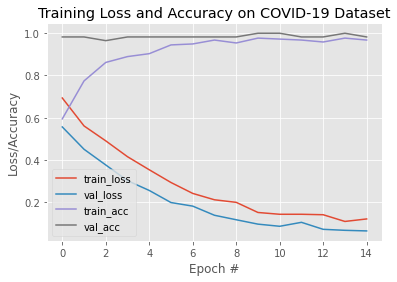

In [ ]:
# plot the training loss and accuracy
N = EPOCHS
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy on COVID-19 Dataset")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.savefig("plot.png")

In [ ]:
#matrices
predIdxs = vggmodel.predict(testX, batch_size=BS)
predIdxs = np.argmax(predIdxs, axis=1)
cm = confusion_matrix(testY.argmax(axis=1), predIdxs)
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
precision = cm[0, 0] / (cm[0, 0] + cm[0, 1])
recall = cm[1, 1] / (cm[1, 0] + cm[1, 1])
print(cm)
print("acc: {:.4f}".format(acc))
print("precision: {:.4f}".format(precision))
print("recall: {:.4f}".format(recall))


[[27  1]
 [ 0 29]]
acc: 0.9825
precision: 0.9643
recall: 1.0000


In [ ]:
target_names = ['Normal','Covid-19']
from skimage import data, color, io, img_as_float
def get_heatmap(vgg_conv, processed_image, class_idx):
  eps=1e-8
  gradModel = Model(
    inputs=[vgg_conv.inputs],
    outputs=[vgg_conv.get_layer('block5_conv3').output, vgg_conv.output])
  with tf.GradientTape() as tape:
    inputs = tf.cast(processed_image, tf.float32)
    (convoutputs, predictions) = gradModel(inputs)
    loss = predictions[:, class_idx]
  # use automatic differentiation to compute the gradients
  grads = tape.gradient(loss, convoutputs)
  # compute the guided gradients
  castConvoutputs = tf.cast(convoutputs > 0, "float32")
  castGrads = tf.cast(grads > 0, "float32")
  guidedGrads = castConvoutputs * castGrads * grads
  convoutputs = convoutputs[0]
  guidedGrads = guidedGrads[0]
  weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
  cam = tf.reduce_sum(tf.multiply(weights, convoutputs), axis=-1)
  (w, h) = (processed_image.shape[2], processed_image.shape[1])
  heatmap = cv2.resize(cam.numpy(), (w, h))
  numer = heatmap - np.min(heatmap)
  denom = (heatmap.max() - heatmap.min()) + eps
  heatmap = numer / denom
  heatmap = (heatmap * 255).astype("uint8")
  return heatmap

In [ ]:
def print_GradCAM(base_model, path_image):
  # select the sample and read the corresponding image and label
  sample_image = cv2.imread(path_image)
  # pre-process the image
  sample_image = cv2.resize(sample_image, (224,224))
  if sample_image.shape[2] ==1:
    sample_image = np.dstack([sample_image, sample_image, sample_image])
  sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)
  sample_image = sample_image.astype(np.float32)/255.
  # sample_label = 1
  #since we pass only one image,we expand dim to include batch size 1
  sample_image_processed = np.expand_dims(sample_image, axis=0)
  # get the label predicted by our original model
  pred_label = np.argmax(base_model.predict(sample_image_processed), axis=-1)[0]
  # get the heatmap for class activation map(CAM)
  heatmap = get_heatmap(base_model, sample_image_processed, pred_label)
  heatmap = cv2.resize(heatmap, (sample_image.shape[0], sample_image.shape[1]))
  heatmap = heatmap *255
  heatmap = np.clip(heatmap, 0, 255).astype(np.uint8)
  heatmap = 255 - heatmap
  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
  # f,ax = plt.subplots(1,2, figsize=(16,6))
  plt.figure()
  f, ax = plt.subplots(ncols=3, figsize=(16, 6))
  ax[1].imshow(heatmap)
  ax[1].set_title("heatmap")
  ax[1].axis('off')
  #superimpose the heatmap on the image 
  sample_image_hsv = color.rgb2hsv(sample_image)
  heatmap = color.rgb2hsv(heatmap)
  alpha=0.7
  sample_image_hsv[..., 0] = heatmap[..., 0]
  sample_image_hsv[..., 1] = heatmap[..., 1] * alpha
  img_masked = color.hsv2rgb(sample_image_hsv)
  # f,ax = plt.subplots(1,2, figsize=(16,6))
  ax[0].imshow(sample_image)
  ax[0].set_title(f"original image (predicted label: {target_names[pred_label]})")
  ax[0].axis('off')
  ax[2].imshow(img_masked)
  ax[2].set_title("superimposed image")
  ax[2].axis('off')
  plt.show()

<Figure size 432x288 with 0 Axes>

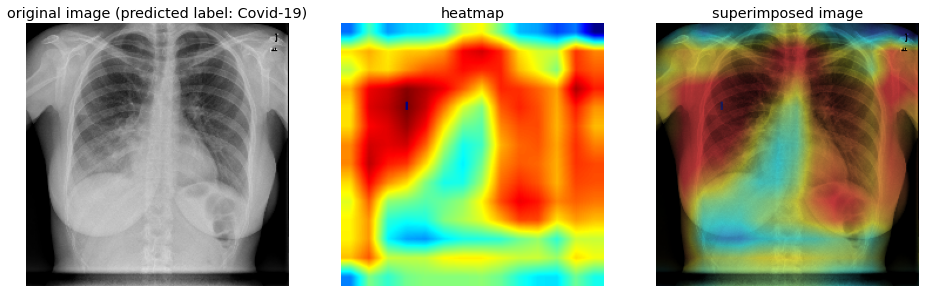

In [ ]:
outputPath ='../content/input/covid-chest-xray/images/16664_1_1.jpg'
print_GradCAM(vggmodel, outputPath)

<Figure size 432x288 with 0 Axes>

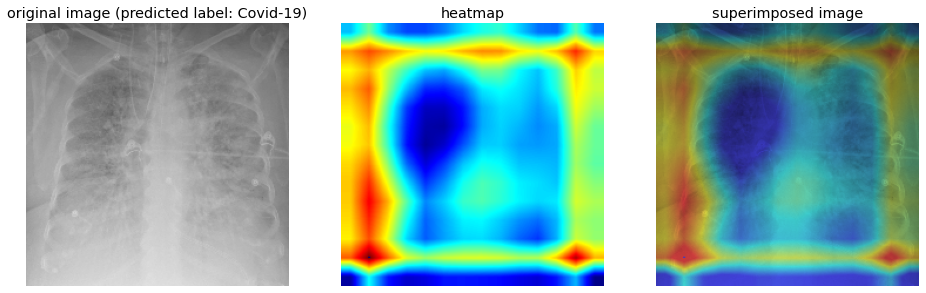

In [ ]:
outputPath = '../content/input/covid-chest-xray/images/covid-19-rapidly-progressive-acute-respiratory-distress-syndrome-ards-day-3.jpg'
print_GradCAM(vggmodel, outputPath)

<Figure size 432x288 with 0 Axes>

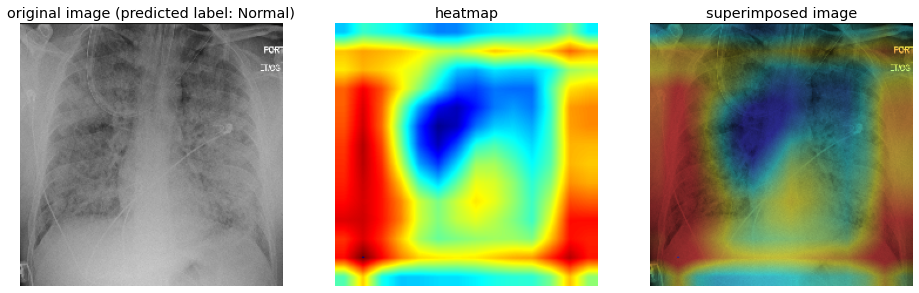

<Figure size 432x288 with 0 Axes>

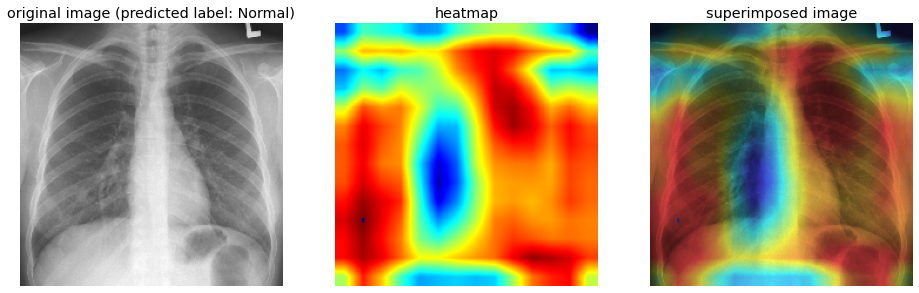

<Figure size 432x288 with 0 Axes>

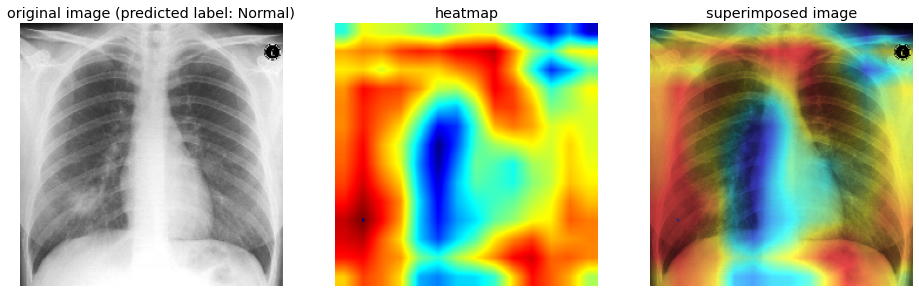

<Figure size 432x288 with 0 Axes>

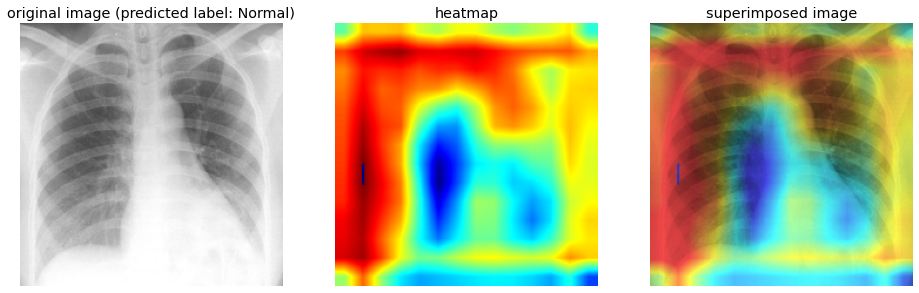

<Figure size 432x288 with 0 Axes>

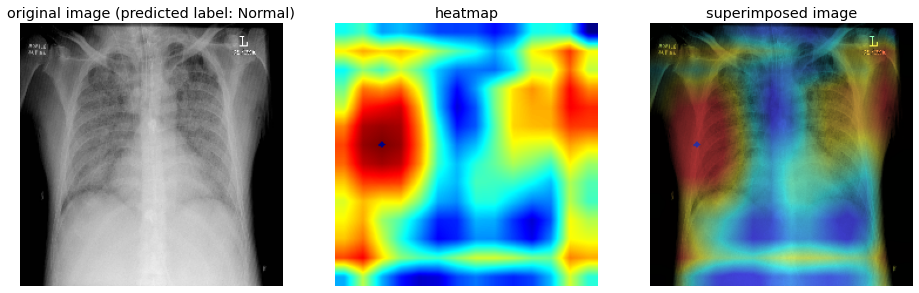

<Figure size 432x288 with 0 Axes>

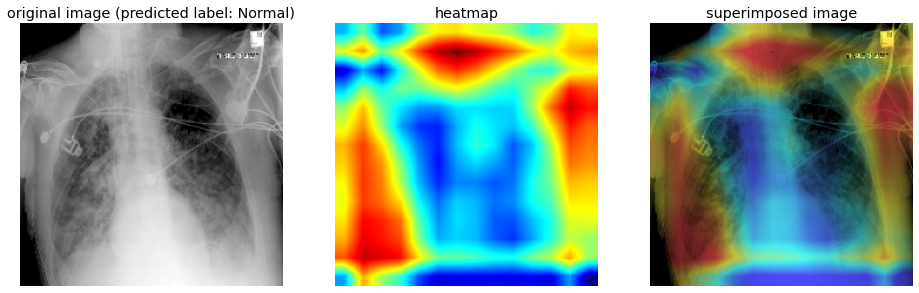

<Figure size 432x288 with 0 Axes>

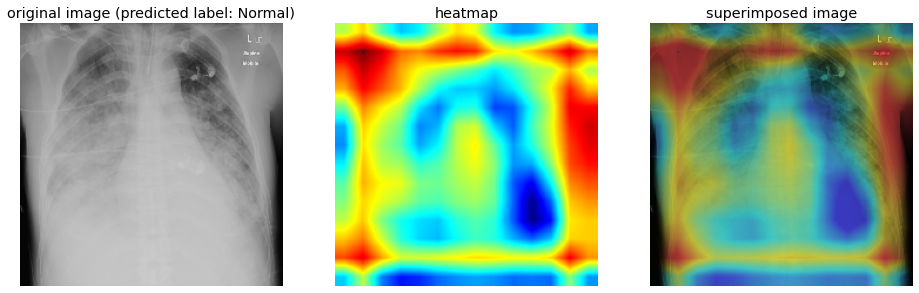

<Figure size 432x288 with 0 Axes>

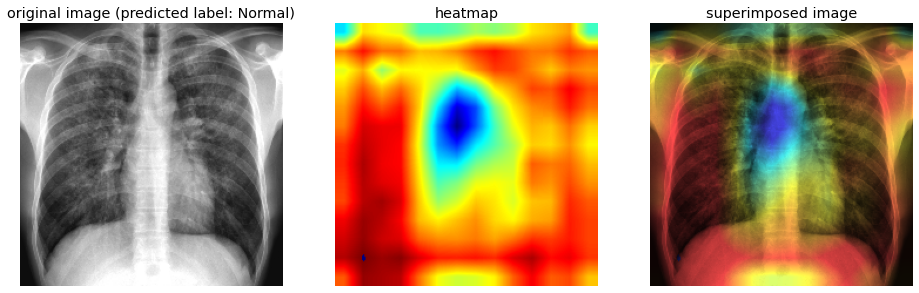

<Figure size 432x288 with 0 Axes>

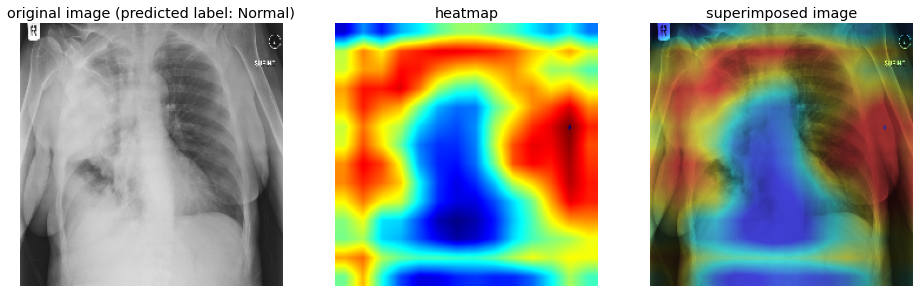

<Figure size 432x288 with 0 Axes>

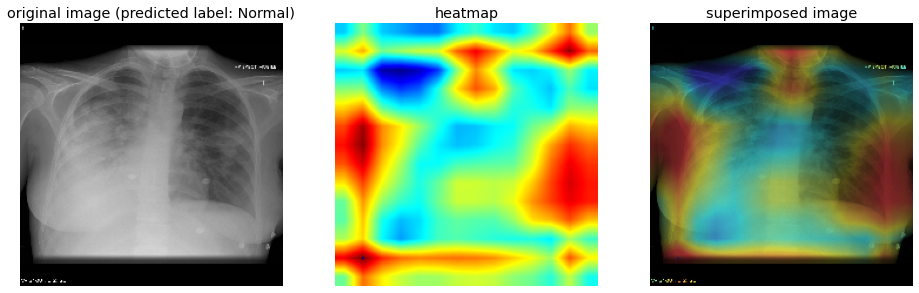

<Figure size 432x288 with 0 Axes>

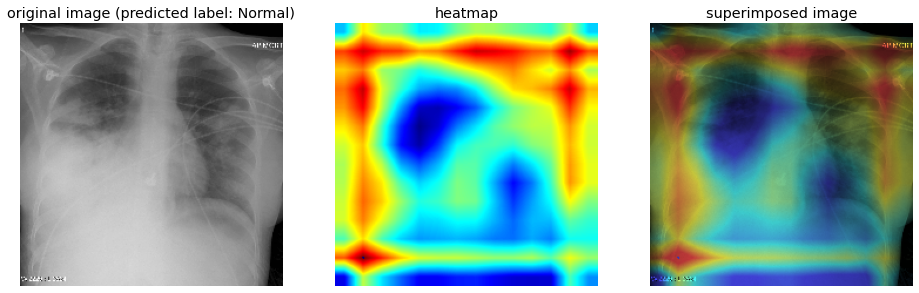

<Figure size 432x288 with 0 Axes>

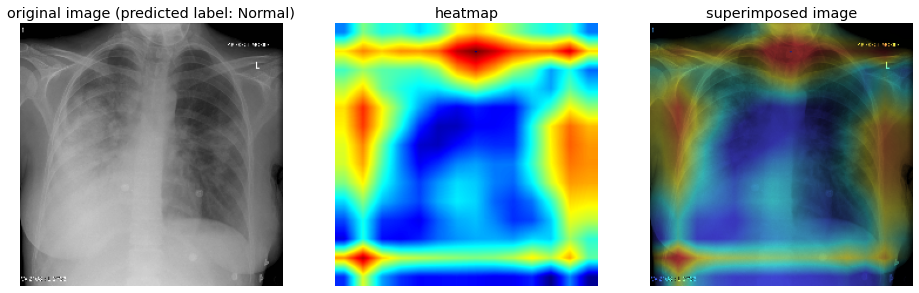

<Figure size 432x288 with 0 Axes>

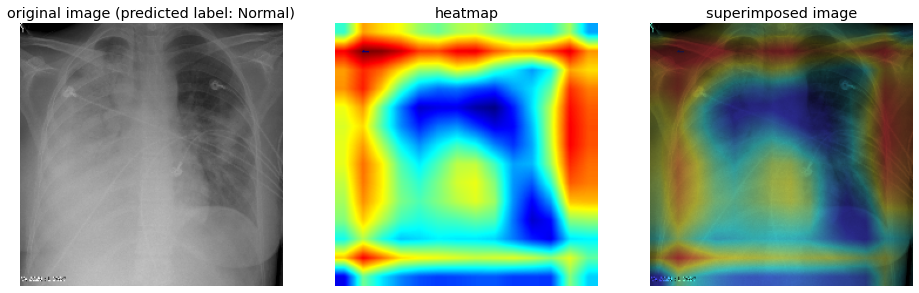

<Figure size 432x288 with 0 Axes>

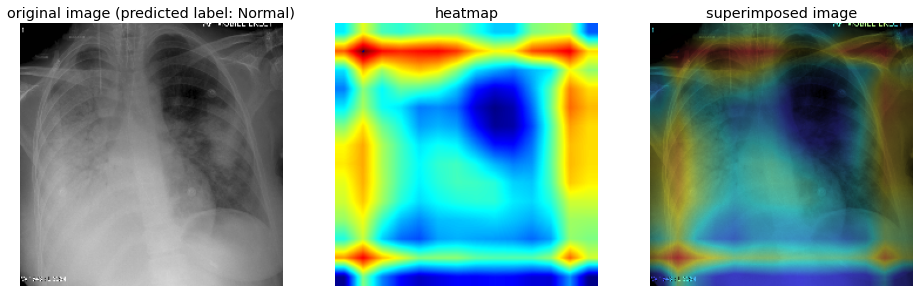

<Figure size 432x288 with 0 Axes>

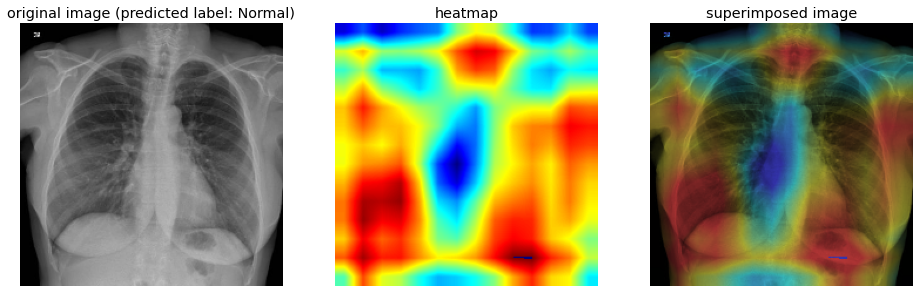

<Figure size 432x288 with 0 Axes>

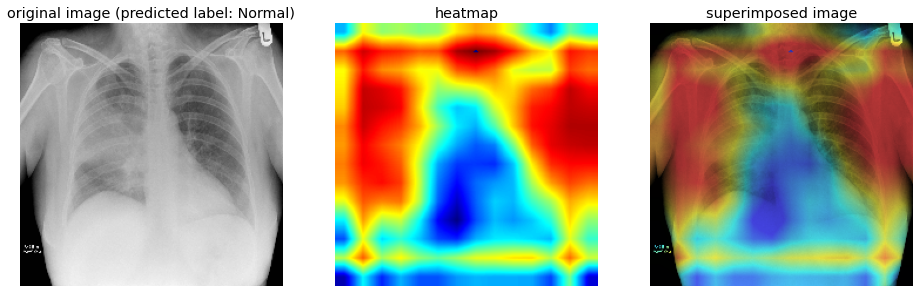

<Figure size 432x288 with 0 Axes>

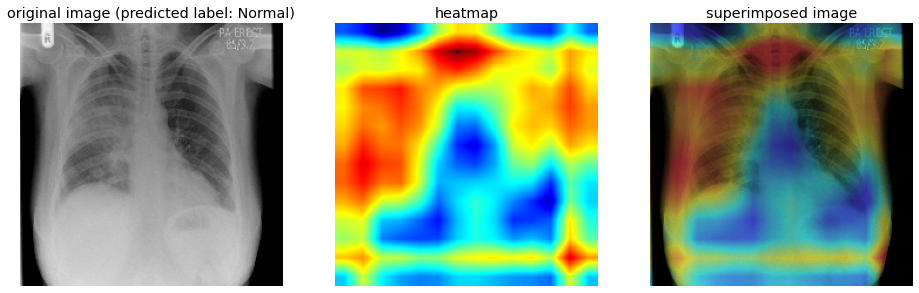

<Figure size 432x288 with 0 Axes>

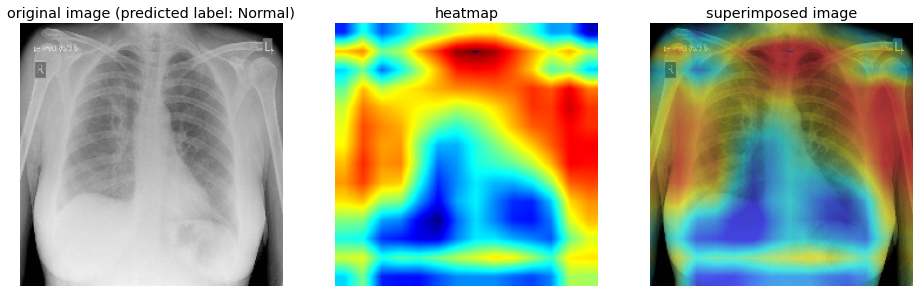

<Figure size 432x288 with 0 Axes>

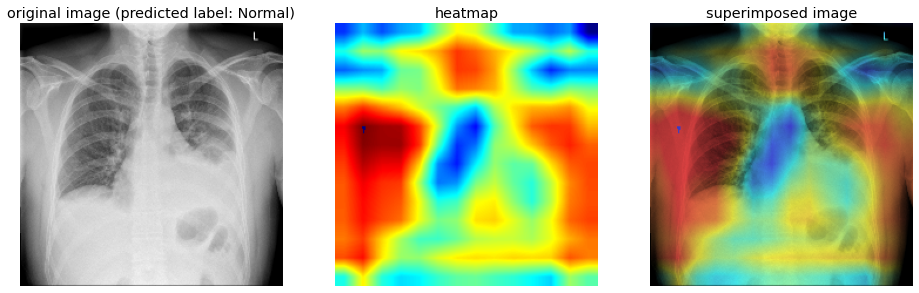

<Figure size 432x288 with 0 Axes>

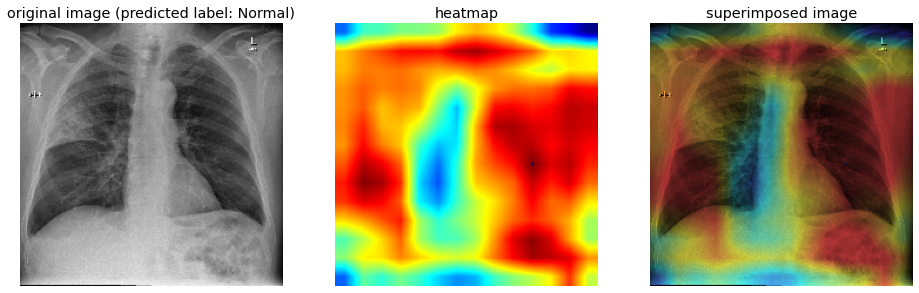

<Figure size 432x288 with 0 Axes>

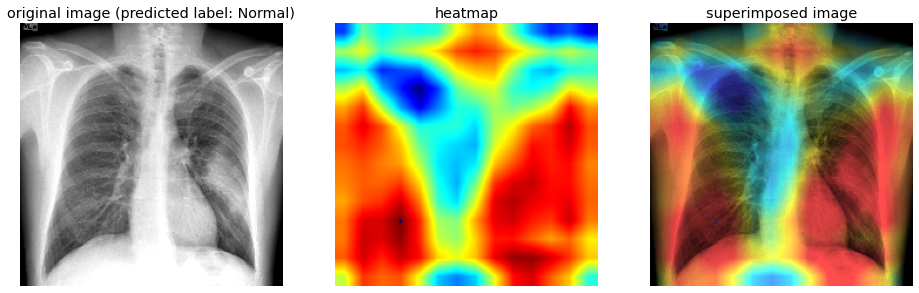

<Figure size 432x288 with 0 Axes>

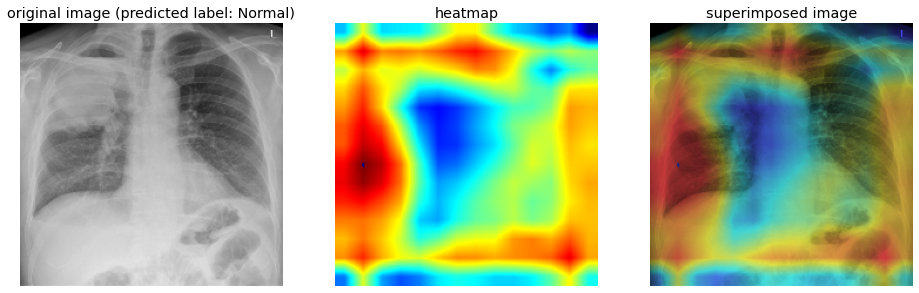

<Figure size 432x288 with 0 Axes>

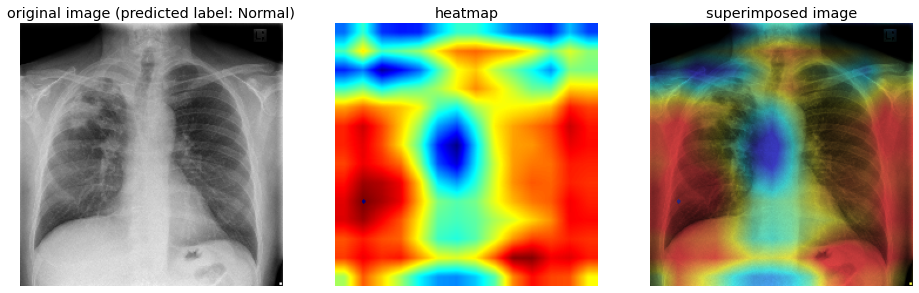

<Figure size 432x288 with 0 Axes>

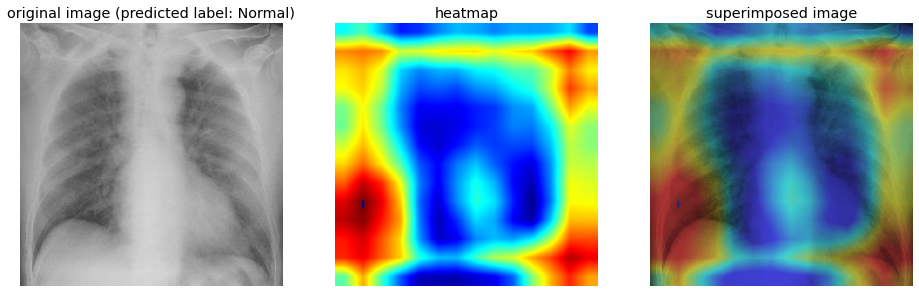

<Figure size 432x288 with 0 Axes>

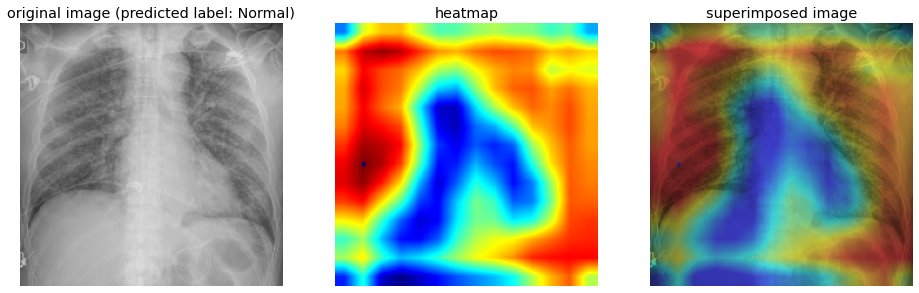

<Figure size 432x288 with 0 Axes>

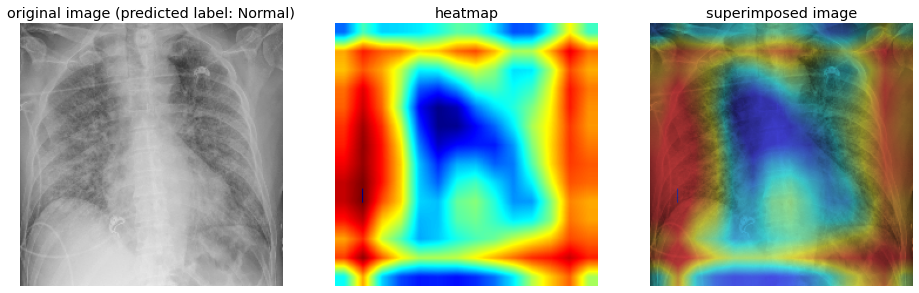

<Figure size 432x288 with 0 Axes>

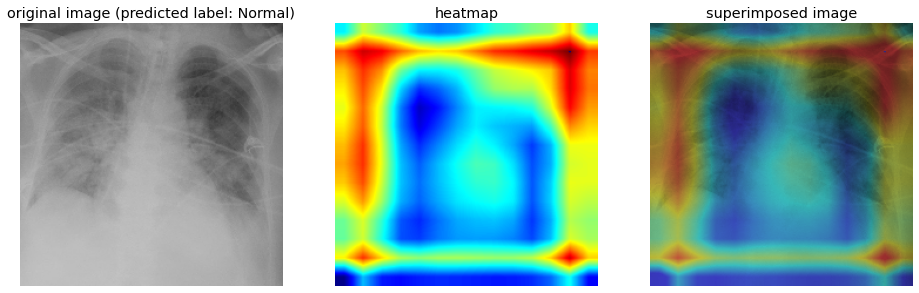

<Figure size 432x288 with 0 Axes>

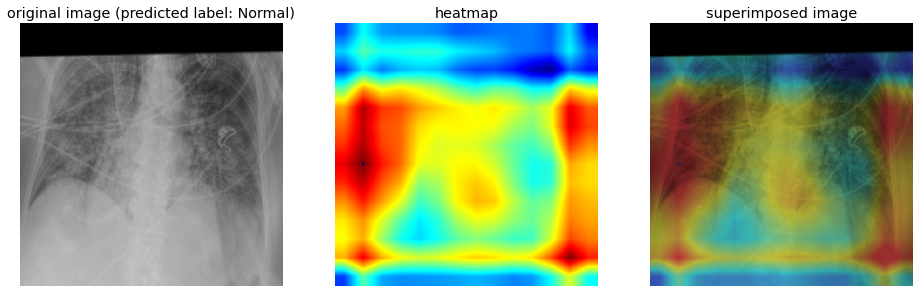

<Figure size 432x288 with 0 Axes>

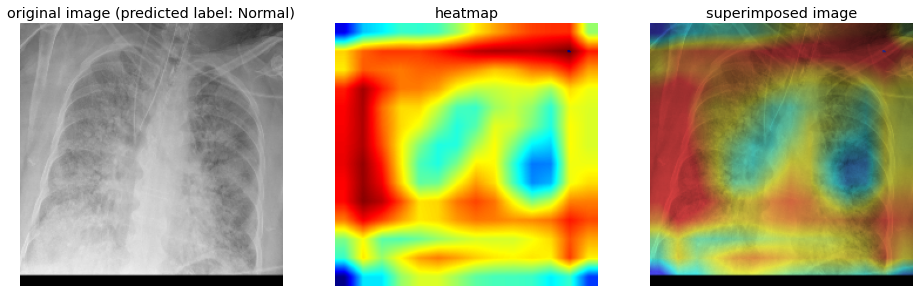

<Figure size 432x288 with 0 Axes>

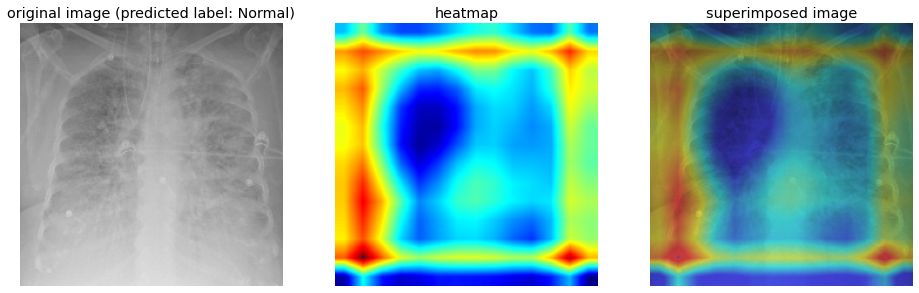

<Figure size 432x288 with 0 Axes>

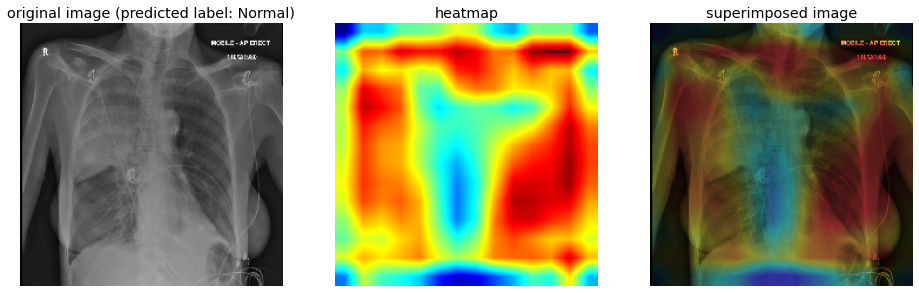

<Figure size 432x288 with 0 Axes>

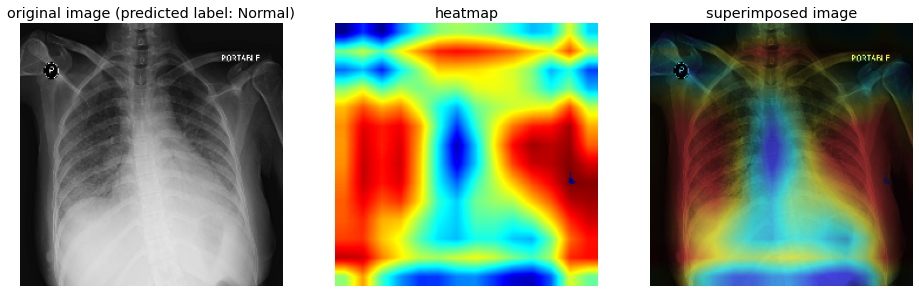

<Figure size 432x288 with 0 Axes>

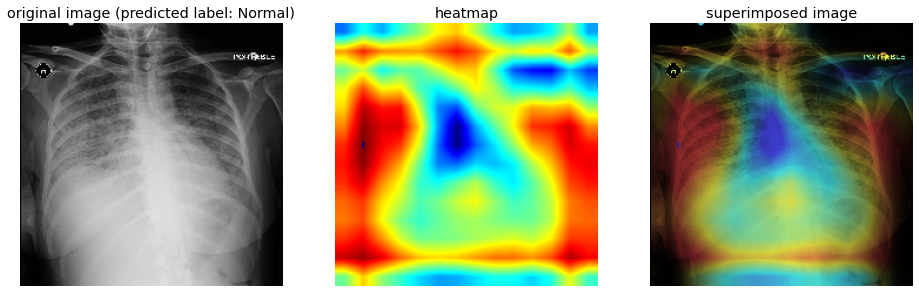

<Figure size 432x288 with 0 Axes>

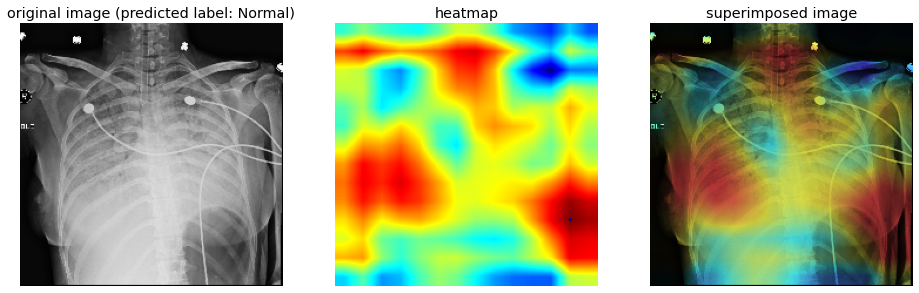

<Figure size 432x288 with 0 Axes>

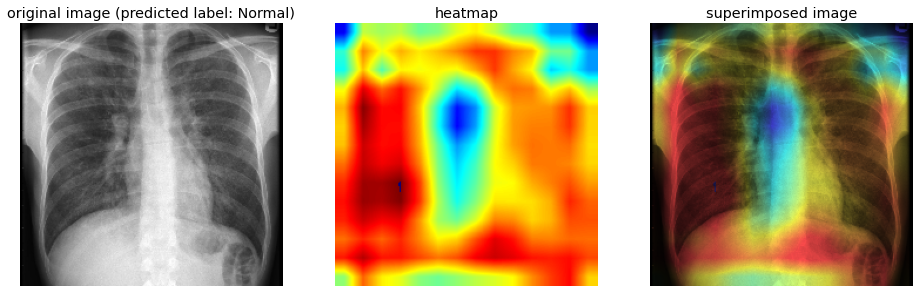

<Figure size 432x288 with 0 Axes>

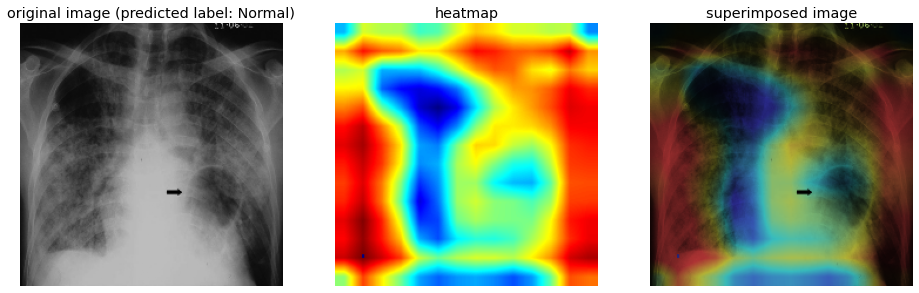

<Figure size 432x288 with 0 Axes>

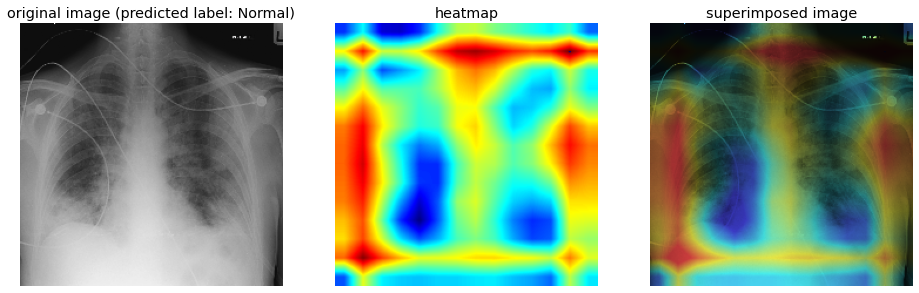

<Figure size 432x288 with 0 Axes>

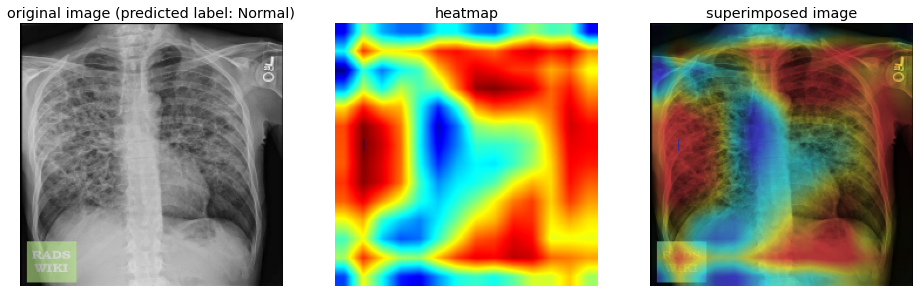

<Figure size 432x288 with 0 Axes>

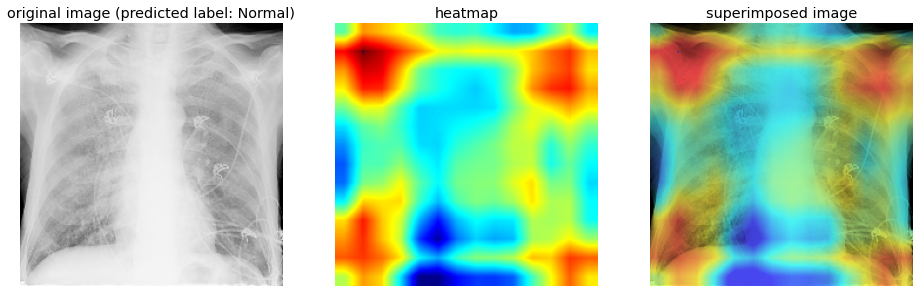

<Figure size 432x288 with 0 Axes>

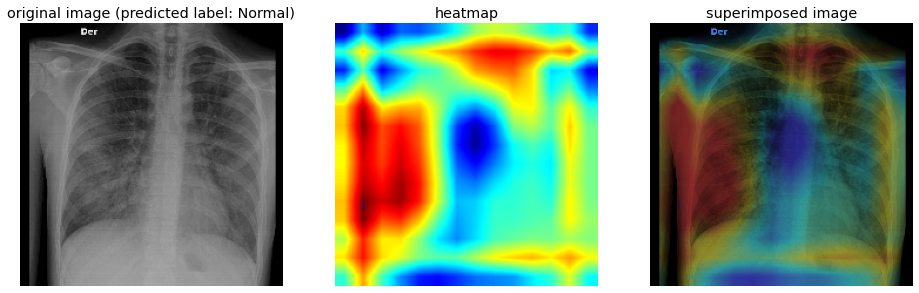

<Figure size 432x288 with 0 Axes>

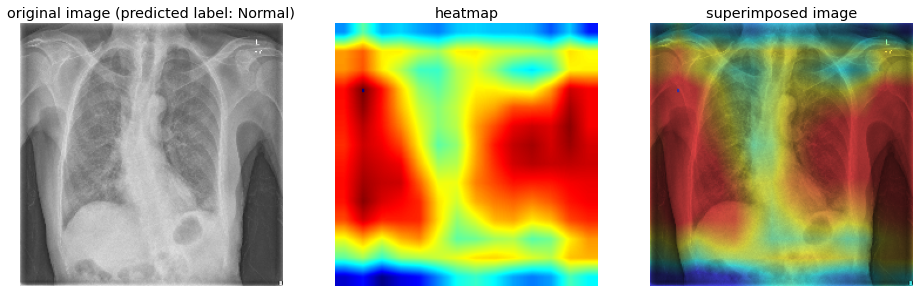

<Figure size 432x288 with 0 Axes>

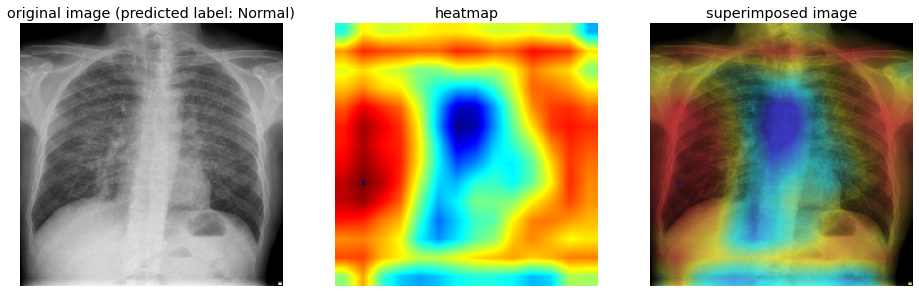

<Figure size 432x288 with 0 Axes>

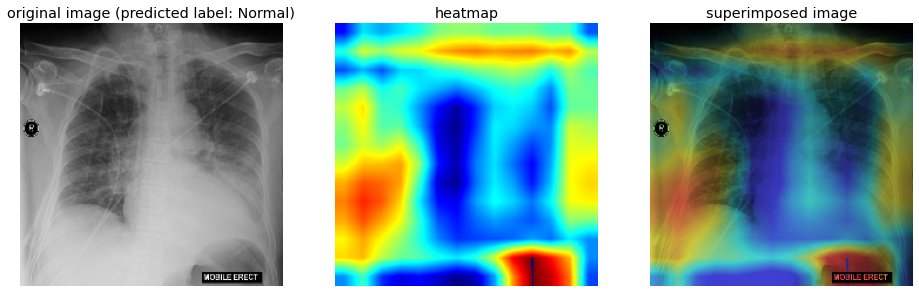

<Figure size 432x288 with 0 Axes>

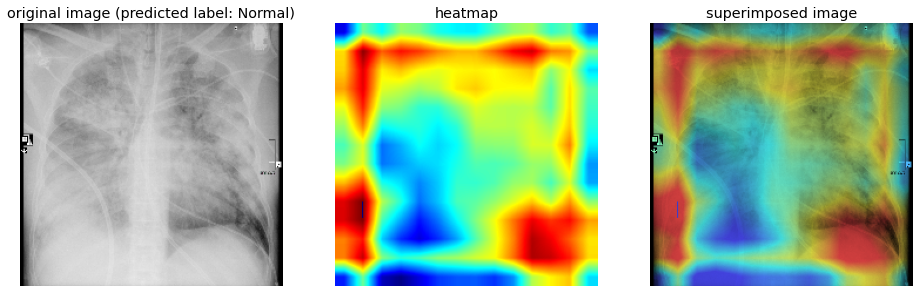

<Figure size 432x288 with 0 Axes>

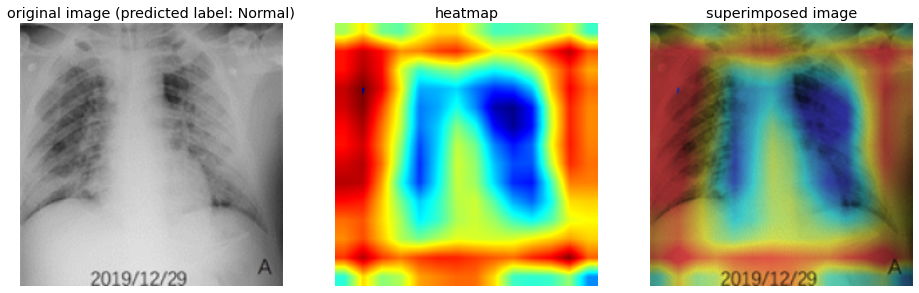

<Figure size 432x288 with 0 Axes>

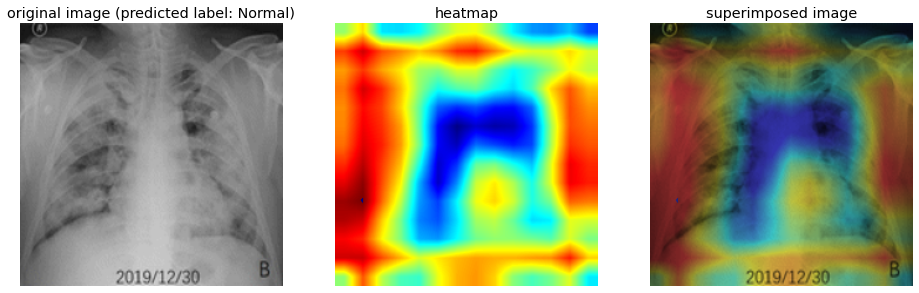

<Figure size 432x288 with 0 Axes>

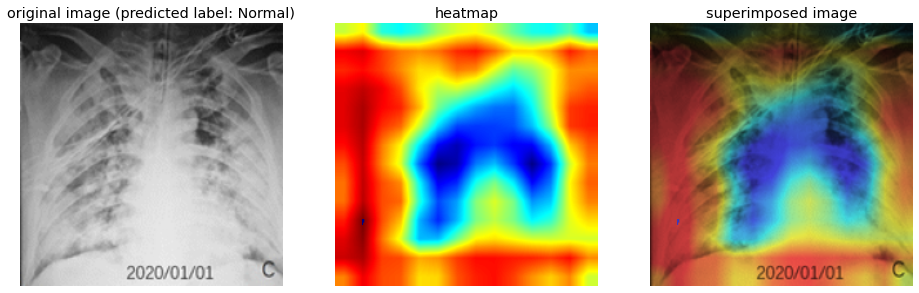

<Figure size 432x288 with 0 Axes>

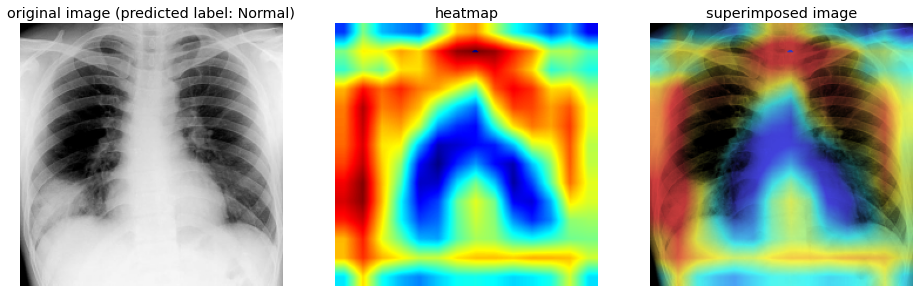

<Figure size 432x288 with 0 Axes>

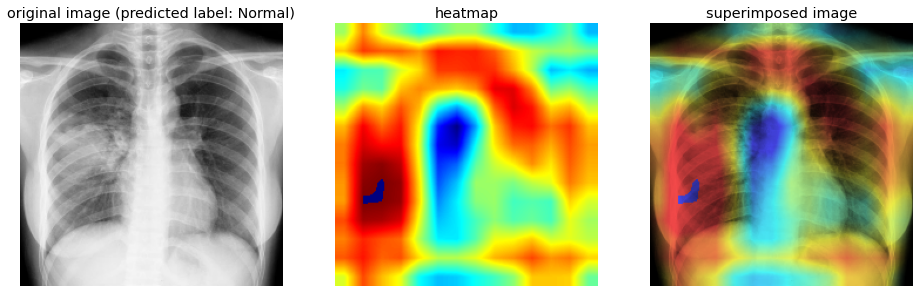

<Figure size 432x288 with 0 Axes>

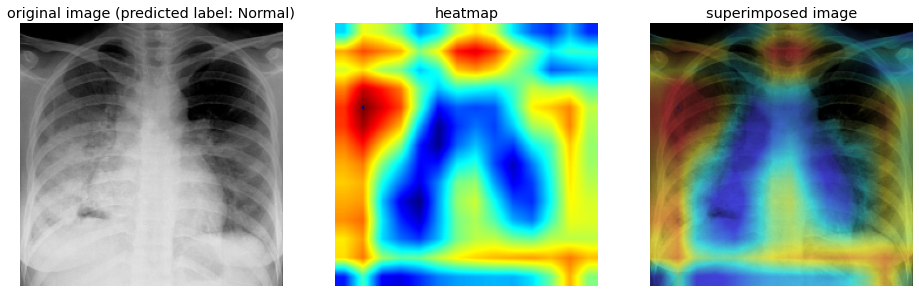

<Figure size 432x288 with 0 Axes>

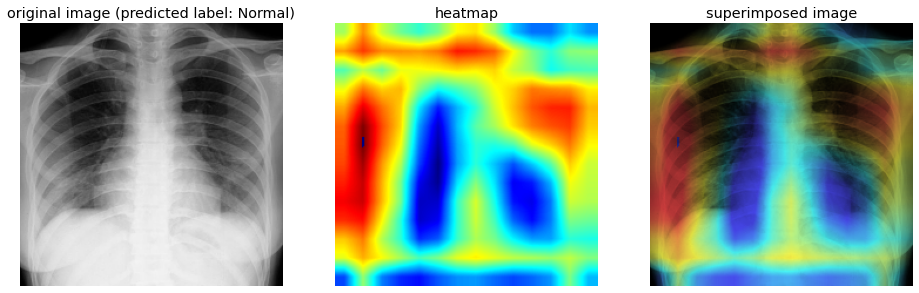

<Figure size 432x288 with 0 Axes>

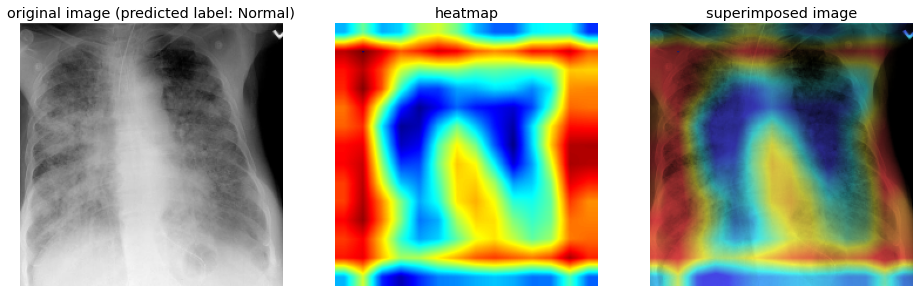

<Figure size 432x288 with 0 Axes>

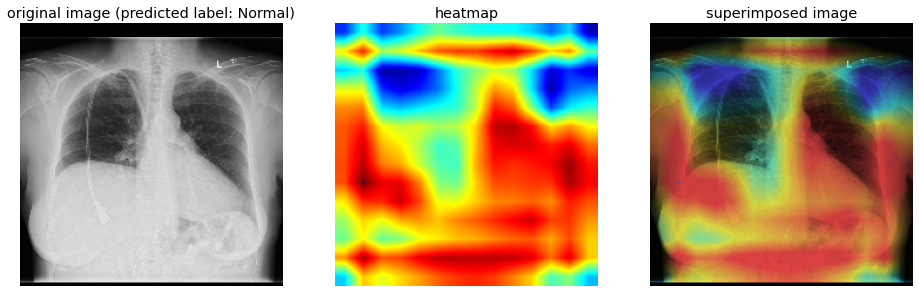

<Figure size 432x288 with 0 Axes>

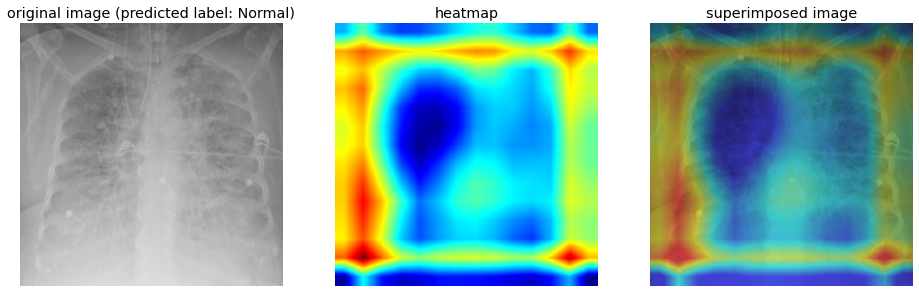

In [ ]:
covid_dataset_path='../content/input/covid-chest-xray'
csvPath = os.path.sep.join([covid_dataset_path, "metadata.csv"])
df = pd.read_csv(csvPath)
for (i, row) in df.iterrows():
  # if (1) the current case is not COVID-19 or (2) this is not
  # a 'PA' view, then ignore the row
  target_names = ['Covid-19','Normal']
  if row["finding"] == "COVID-19" or row["view"] != "PA" :
    continue
  imagePath = os.path.sep.join([covid_dataset_path, "images", row["filename"]])
  if not os.path.exists(imagePath):
    continue
  print_GradCAM(vggmodel, imagePath)

In [ ]:
!pip install tf-explain

     |████████████████████████████████| 43 kB 1.5 MB/s 


In [ ]:
from tf_explain.core.activations import ExtractActivations
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.layers import BatchNormalization

In [ ]:
baseModel = DenseNet121(input_shape = (224, 224, 3),include_top = False, weights = None)
headModel = baseModel.output
headModel=  BatchNormalization()(headModel)
headModel = AveragePooling2D(pool_size=(4, 4))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(64, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(2, activation="softmax")(headModel)
dense_model = Model(inputs=baseModel.input, outputs=headModel)
for layer in baseModel.layers:
  layer.trainable = False
print(dense_model.summary())

Model: "model_57"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_2[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                           

In [ ]:
#Using Adam optimizer
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
dense_model.compile(loss="binary_crossentropy", optimizer=opt, metrics=["accuracy"])

In [ ]:
# train the head of the network
print("[INFO] training head...")
H = dense_model.fit_generator(
  trainAug.flow(trainX, trainY, batch_size=BS),
  steps_per_epoch=len(trainX) // BS,
  validation_data=(testX, testY),
  validation_steps=len(testX) // BS,
  epochs=EPOCHS)

[INFO] training head...
Epoch 1/15
28/28 [==============================] - 18s 339ms/step - loss: 0.6170 - accuracy: 0.7650 - val_loss: 0.6872 - val_accuracy: 0.8246
Epoch 2/15
28/28 [==============================] - 4s 139ms/step - loss: 0.4655 - accuracy: 0.8479 - val_loss: 0.6769 - val_accuracy: 0.8246
Epoch 3/15
28/28 [==============================] - 4s 140ms/step - loss: 0.3596 - accuracy: 0.9124 - val_loss: 0.6624 - val_accuracy: 1.0000
Epoch 4/15
28/28 [==============================] - 4s 140ms/step - loss: 0.3033 - accuracy: 0.9263 - val_loss: 0.6743 - val_accuracy: 0.5088
Epoch 5/15
28/28 [==============================] - 4s 138ms/step - loss: 0.2134 - accuracy: 0.9493 - val_loss: 0.6674 - val_accuracy: 0.5088
Epoch 6/15
28/28 [==============================] - 4s 145ms/step - loss: 0.1831 - accuracy: 0.9539 - val_loss: 0.5873 - val_accuracy: 0.8596
Epoch 7/15
28/28 [==============================] - 4s 139ms/step - loss: 0.1631 - accuracy: 0.9631 - val_loss: 0.5984 - va

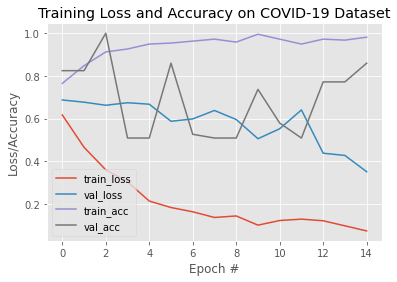

In [ ]:
# plot the training loss and accuracy
N = EPOCHS
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy on COVID-19 Dataset")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.savefig("plot.png")

In [ ]:
#matrices
predIdxs = dense_model.predict(testX, batch_size=BS)
predIdxs = np.argmax(predIdxs, axis=1)
cm = confusion_matrix(testY.argmax(axis=1), predIdxs)
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
print(cm)
print("acc: {:.4f}".format(acc))
print("precision: {:.4f}".format(sensitivity))
print("recall: {:.4f}".format(specificity))

[[20  8]
 [ 0 29]]
acc: 0.8596
precision: 0.7143
recall: 1.0000


In [ ]:
from skimage import data, color, io, img_as_float
def get_heatmap(vgg_conv, processed_image, class_idx):
  eps=1e-8
  gradModel = Model(
    inputs=[vgg_conv.inputs],
    outputs=[vgg_conv.get_layer('conv5_block16_2_conv').output, vgg_conv.output])
  with tf.GradientTape() as tape:
    inputs = tf.cast(processed_image, tf.float32)
    (convoutputs, predictions) = gradModel(inputs)
    loss = predictions[:, class_idx]
  # use automatic differentiation to compute the gradients
  grads = tape.gradient(loss, convoutputs)
  # compute the guided gradients
  castConvoutputs = tf.cast(convoutputs > 0, "float32")
  castGrads = tf.cast(grads > 0, "float32")
  guidedGrads = castConvoutputs * castGrads * grads
  convoutputs = convoutputs[0]
  guidedGrads = guidedGrads[0]
  weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
  cam = tf.reduce_sum(tf.multiply(weights, convoutputs), axis=-1)
  (w, h) = (processed_image.shape[2], processed_image.shape[1])
  heatmap = cv2.resize(cam.numpy(), (w, h))
  numer = heatmap - np.min(heatmap)
  denom = (heatmap.max() - heatmap.min()) + eps
  heatmap = numer / denom
  heatmap = (heatmap * 255).astype("uint8")
  return heatmap

<Figure size 432x288 with 0 Axes>

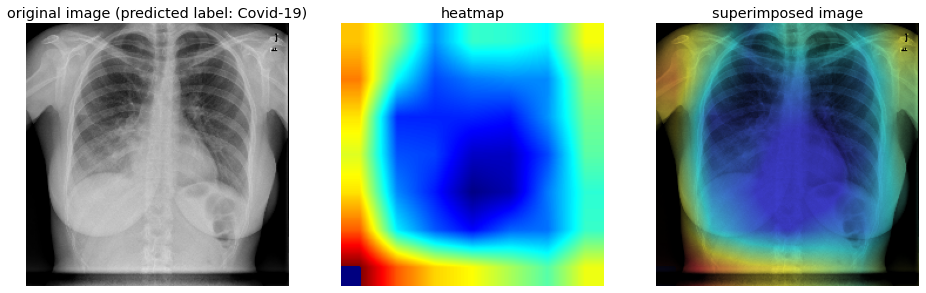

In [ ]:
target_names = ['Normal','Covid-19']
outputPath = '../content/input/covid-chest-xray/images/16664_1_1.jpg'
print_GradCAM(dense_model, outputPath)

<Figure size 432x288 with 0 Axes>

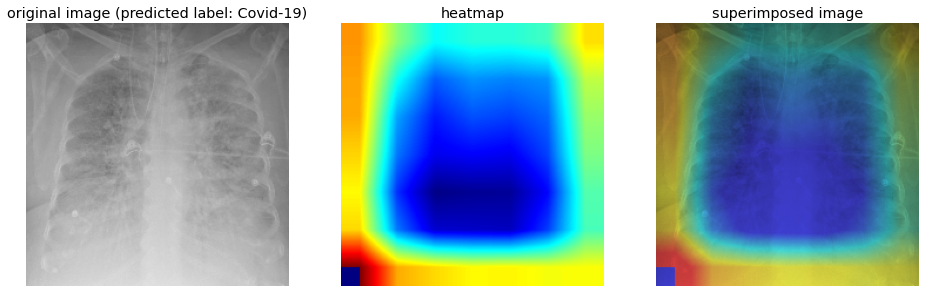

In [ ]:
outputPath = '../content/input/covid-chest-xray/images/covid-19-rapidly-progressive-acute-respiratory-distress-syndrome-ards-day-3.jpg'
print_GradCAM(dense_model, outputPath)

In [ ]:
from tf_explain.core.activations import ExtractActivations
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import BatchNormalization

In [ ]:
baseModel = ResNet50(input_shape = (224, 224, 3), 
  include_top = False, weights = None)
headModel = baseModel.output
headModel=BatchNormalization()(headModel)
headModel = AveragePooling2D(pool_size=(4, 4))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(64, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(2, activation="softmax")(headModel)
resnet = Model(inputs=baseModel.input, outputs=headModel)
for layer in baseModel.layers:
  layer.trainable = False
print(resnet.summary())

Model: "model_60"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [ ]:
#Using Adam optimizer
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
resnet.compile(loss="binary_crossentropy", optimizer=opt, metrics=["accuracy"])

In [ ]:
# train the head of the network
print("[INFO] training head...")
H = resnet.fit_generator(
  trainAug.flow(trainX, trainY, batch_size=BS),
  steps_per_epoch=len(trainX) // BS,
  validation_data=(testX, testY),
  validation_steps=len(testX) // BS,
  epochs=EPOCHS)

[INFO] training head...
Epoch 1/15
28/28 [==============================] - 12s 265ms/step - loss: 0.6100 - accuracy: 0.6728 - val_loss: 0.6929 - val_accuracy: 0.5088
Epoch 2/15
28/28 [==============================] - 4s 135ms/step - loss: 0.4121 - accuracy: 0.8618 - val_loss: 0.6808 - val_accuracy: 0.5088
Epoch 3/15
28/28 [==============================] - 4s 138ms/step - loss: 0.3217 - accuracy: 0.8940 - val_loss: 0.6786 - val_accuracy: 0.5088
Epoch 4/15
28/28 [==============================] - 4s 138ms/step - loss: 0.2702 - accuracy: 0.9309 - val_loss: 0.6692 - val_accuracy: 0.5088
Epoch 5/15
28/28 [==============================] - 4s 135ms/step - loss: 0.2338 - accuracy: 0.9217 - val_loss: 0.6332 - val_accuracy: 0.5088
Epoch 6/15
28/28 [==============================] - 4s 137ms/step - loss: 0.1939 - accuracy: 0.9401 - val_loss: 0.6384 - val_accuracy: 0.5088
Epoch 7/15
28/28 [==============================] - 4s 141ms/step - loss: 0.1684 - accuracy: 0.9309 - val_loss: 0.6245 - va

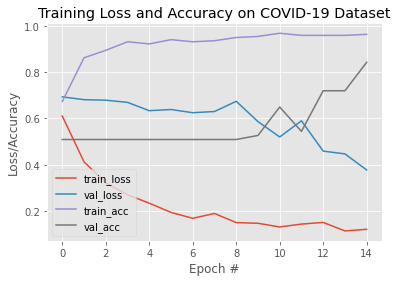

In [ ]:
# plot the training loss and accuracy
N = EPOCHS
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, N), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, N), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy on COVID-19 Dataset")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.savefig("plot.png")

In [ ]:
#matrices
predIdxs = resnet.predict(testX, batch_size=BS)
predIdxs = np.argmax(predIdxs, axis=1)
cm = confusion_matrix(testY.argmax(axis=1), predIdxs)
total = sum(sum(cm))
acc = (cm[0, 0] + cm[1, 1]) / total
sensitivity = cm[0, 0] / (cm[0, 0] + cm[0, 1])
specificity = cm[1, 1] / (cm[1, 0] + cm[1, 1])
print(cm)
print("acc: {:.4f}".format(acc))
print("precision: {:.4f}".format(sensitivity))
print("recall: {:.4f}".format(specificity))

[[19  9]
 [ 0 29]]
acc: 0.8421
precision: 0.6786
recall: 1.0000


In [ ]:
from skimage import data, color, io, img_as_float
def get_heatmap(vgg_conv, processed_image, class_idx):
  eps=1e-8
  gradModel = Model(
    inputs=[vgg_conv.inputs],
    outputs=[vgg_conv.get_layer('conv5_block3_3_conv').output, vgg_conv.output])
  with tf.GradientTape() as tape:
    inputs = tf.cast(processed_image, tf.float32)
    (convoutputs, predictions) = gradModel(inputs)
    loss = predictions[:, class_idx]
  # use automatic differentiation to compute the gradients
  grads = tape.gradient(loss, convoutputs)
  # compute the guided gradients
  castConvoutputs = tf.cast(convoutputs > 0, "float32")
  castGrads = tf.cast(grads > 0, "float32")
  guidedGrads = castConvoutputs * castGrads * grads
  convoutputs = convoutputs[0]
  guidedGrads = guidedGrads[0]
  weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
  cam = tf.reduce_sum(tf.multiply(weights, convoutputs), axis=-1)
  (w, h) = (processed_image.shape[2], processed_image.shape[1])
  heatmap = cv2.resize(cam.numpy(), (w, h))
  numer = heatmap - np.min(heatmap)
  denom = (heatmap.max() - heatmap.min()) + eps
  heatmap = numer / denom
  heatmap = (heatmap * 255).astype("uint8")
  return heatmap

<Figure size 432x288 with 0 Axes>

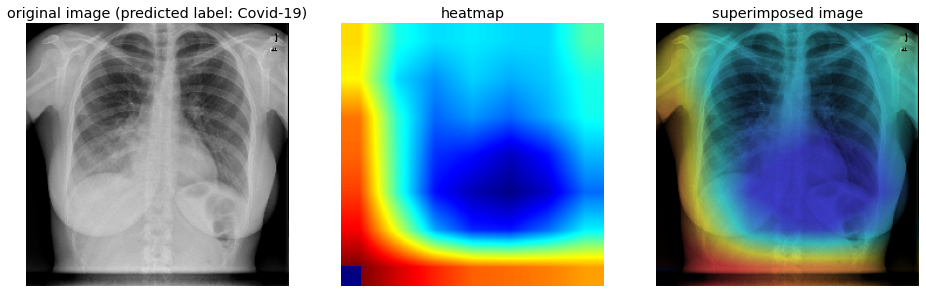

<Figure size 432x288 with 0 Axes>

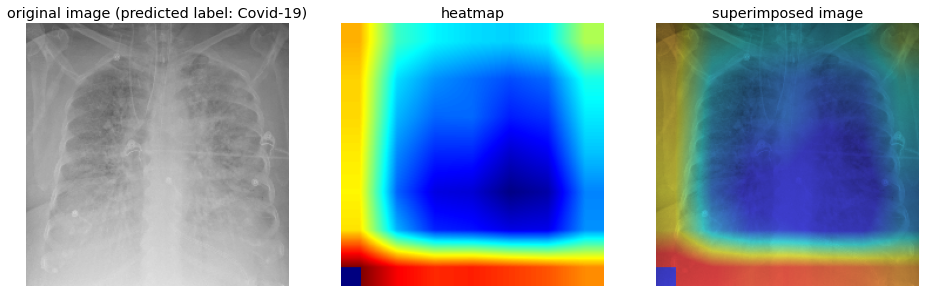

In [ ]:
outputPath = '../content/input/covid-chest-xray/images/16664_1_1.jpg'
print_GradCAM(resnet, outputPath)
outputPath = '../content/input/covid-chest-xray/images/covid-19-rapidly-progressive-acute-respiratory-distress-syndrome-ards-day-3.jpg'
print_GradCAM(resnet, outputPath)